
<h1><b>Clean Train Data</b></h1>

<b>Visual Information Processing and Management Exam

Sara Arizzi 845374</b>

<hr>

In this notebook we can see the exploration and evaluation of three cleaning approaches:

- Color Histograms
- Bag of Visual Words
- ViT features extraction.



## Setup

In [16]:
import ast
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2 as cv

import zipfile
import shutil

## Data paths

In [17]:
DATA_PATH = os.path.join("..", "data")
LABELED_PATH = os.path.join(DATA_PATH, "manual_labelling")
CH_PATH = os.path.join(DATA_PATH, "ch")
BOVW_PATH = os.path.join(DATA_PATH, "bovw")
VIT_PATH = os.path.join(DATA_PATH, "fe")
ORIG_ZIP = os.path.join(DATA_PATH, "clean", "train_dirty.zip")

In [19]:
# original data (not cleaned) is stored in train_dirty.zip
os.makedirs(os.path.join(DATA_PATH, "temp"), exist_ok=True)
with zipfile.ZipFile(ORIG_ZIP, "r") as zf:
    zf.extractall(os.path.join(DATA_PATH, "temp"))
TEMP_TRAIN = os.path.join(*[DATA_PATH, "temp", "train"])

In [20]:
# shutil.rmtree(os.path.join(DATA_PATH, "temp"), ignore_errors=True)

## Functions

### Visualization

In [21]:
def show_lf_five(code, class_name, df_vectors):
    # Get ch vectors
    col_num = len(df_vectors.columns)
    df_vectors.columns = ["image_name", "vector"] if col_num == 2 else ["image_name", "d", "vector"]
    images_names = df_vectors["image_name"].to_list()
    vectors = df_vectors["vector"].to_list()

    # Calculate similarities
    all_similarities = []
    for i in vectors:
        image_similarities = []
        for j in vectors:
            image_similarities.append(get_cosine_similarity(i, j))
        all_similarities.append(np.sum(image_similarities))
    class_similarities = pd.DataFrame({
        "image_name": images_names,
        "sim_sum": all_similarities
    }).sort_values(by="sim_sum", ascending=False)

    # Plot images (last 5 and first 5)
    last_five = class_similarities.tail(5)["image_name"].to_list()
    first_five = class_similarities.head(5)["image_name"].to_list()
    to_plot = last_five + first_five

    fig, axes = plt.subplots(2, 5, figsize=(15, 6))

    row_titles = ["Least Similar", "Most Similar"]

    for i, ax in enumerate(axes.flat):
        temp_im = os.path.join(*[TEMP_TRAIN, str(code), to_plot[i]])
        im = cv.imread(temp_im)
        im = cv.cvtColor(im, cv.COLOR_BGR2RGB)
        ax.imshow(im)
        ax.axis("off")

    for i, ax in enumerate(axes[:, 0]):
        ax.set_title(row_titles[i], loc='left', fontsize=16, weight='bold')

    plt.suptitle(
        f"Class {class_name}",
        fontsize=20,
        weight='bold'
    )
    plt.tight_layout(rect=(0, 0, 1, 0.95))
    plt.show()

### Calculations

In [22]:
def get_cosine_similarity(a, b):
    try:
        cs = np.dot(a, b) / (np.linalg.norm(a) * np.linalg.norm(b))
        return cs
    except RuntimeWarning:
        return 0  # a and b are zero vectors

In [23]:
def get_ch_vectors(code, bins):
    if bins not in [8, 16, 32, 64, 128, 256]:
        raise Exception("Bins must be 8, 16, 32, 64, 128, or 256!")

    ch_path = os.path.join(CH_PATH, str(code))
    ch_class = pd.read_csv(os.path.join(ch_path, f"ch_{bins}.csv"), sep=";", header=0)
    ch_class["hist"] = ch_class["hist"].apply(
        lambda x: np.array(ast.literal_eval(x.replace('\n', '').replace('  ', ' ').strip())))

    # Scale into 0-1 by dividing by max value
    maxes = ch_class["hist"].apply(lambda x: max(x))
    ch_class["hist"] = ch_class["hist"] / maxes

    return ch_class

In [24]:
def get_bovw_vectors(code, dim):
    if dim not in [10, 20, 40, 80]:
        raise Exception("Dim must be 10, 20, 40, or 80!")

    bovw_path = os.path.join(BOVW_PATH, str(code))
    bovw_class = pd.read_csv(os.path.join(bovw_path, f"tfidf_{dim}.csv"), sep=";", header=0)
    bovw_class["tfidf"] = bovw_class["tfidf"].apply(
        lambda x: np.array(ast.literal_eval(x.replace('\n', '').replace('  ', ' ').strip())))

    # Return all images bovw
    return bovw_class

In [25]:
def get_fe_vectors(code, data):
    fe_path = os.path.join(VIT_PATH, str(code))
    fe_class = pd.read_csv(os.path.join(fe_path, f"vit_{data}.csv"), sep=";", header=0)
    fe_class["vit_feature"] = fe_class["vit_feature"].apply(
        lambda x: np.array(ast.literal_eval(x.replace('\n', '').replace('  ', ' ').strip())))

    # Return all images bovw
    return fe_class

In [26]:
def get_similarities(df_vectors):
    """

    :param df_vectors: contains images names and vector representations
    :type df_vectors: pd.DataFrame
    """
    if len(df_vectors.columns) == 2:
        df_vectors.columns = ["image_name", "vector"]
    else:
        df_vectors.columns = ["image_name", "d", "vector"]

    images_names = df_vectors["image_name"].to_list()
    vec = df_vectors["vector"].to_list()

    # Loop over images and calculate cosine similarity between all
    all_sim = []
    for i in vec:
        image_sim = 0
        for j in vec:
            cosine_sim = get_cosine_similarity(i, j)
            image_sim += cosine_sim
        all_sim.append(image_sim / len(vec))

    df_similarities = pd.DataFrame({
        "image_name": images_names,
        "sim": all_sim
    })

    return df_similarities

In [27]:
def get_outliers(df_similarities):
    df = df_similarities.copy(deep=True)
    # Calculate threshold
    q1 = np.percentile(df["sim"].to_list(), 25)
    iqr = np.percentile(df["sim"].to_list(), 75) - q1
    threshold = q1 - 1.5 * iqr

    # Images with similarity score lte than threshold
    df["predicted"] = df["sim"].apply(lambda x: 1 if x <= threshold else 0)

    return df

In [40]:
def get_percentile(df_similarities, perc):
    df = df_similarities.copy(deep=True)
    # Calculate threshold
    p = np.percentile(df["sim"].to_list(), perc)

    # Images with similarity score lte than threshold
    df["predicted"] = df["sim"].apply(lambda x: 1 if x <= p else 0)

    return df

In [29]:
def check_accuracy(cl_code, to_rem):
    label_path = os.path.join(LABELED_PATH, f"{cl_code}_to_remove.csv")

    labeled = pd.read_csv(label_path, usecols=range(1, 3))

    # Merge
    merged_df = pd.merge(labeled, to_rem, on='image_name')

    actual_positive = merged_df[merged_df["to_remove"] == 1]
    actual_negative = merged_df[merged_df["to_remove"] == 0]

    # Precision and False Positive Rate
    p = np.sum(actual_positive['to_remove'] == actual_positive['predicted']) / len(actual_positive)
    f = np.sum(actual_negative['to_remove'] != actual_negative['predicted']) / len(actual_negative)

    return p, f

# **Compare approaches**

In [30]:
classes = [196, 15, 0, 233, 57, 25]
classes_names = ["omelette", "seaweed", "macaron", "scotch", "gnocchi", "ramen"]

## Five most similar, and five least similar

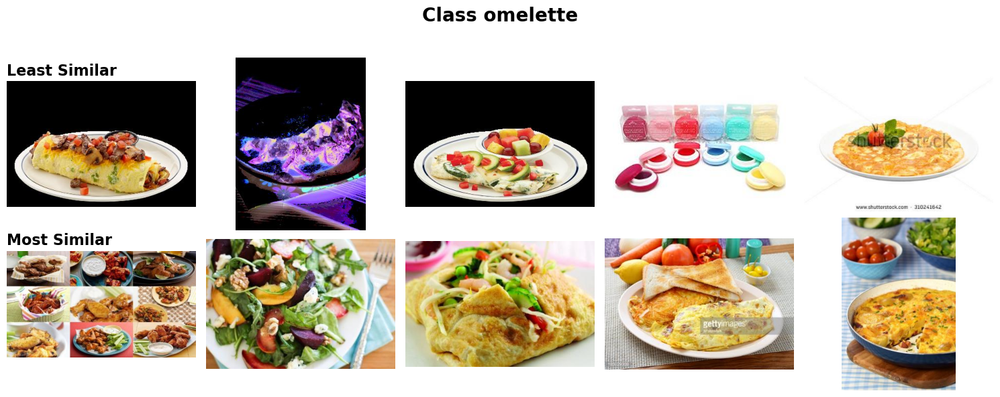

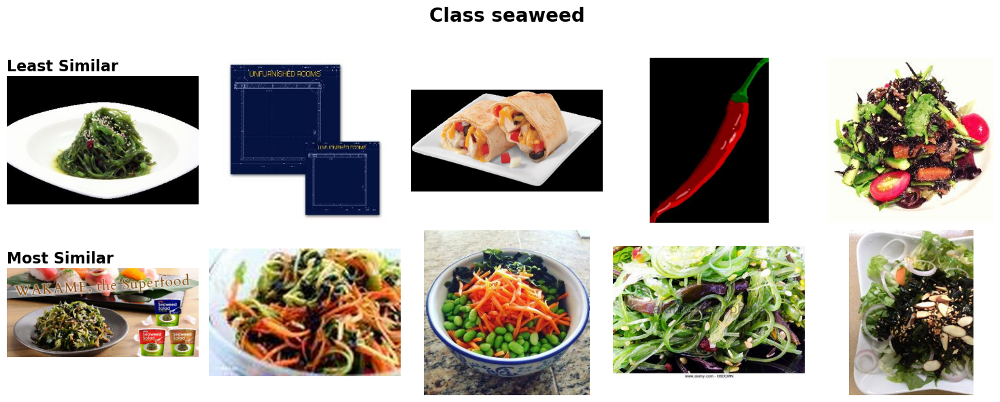

In [31]:
#@title Color histograms
for c, c_name in zip(classes[:2], classes_names[:2]):
  show_lf_five(c, c_name, get_ch_vectors(c, 256))

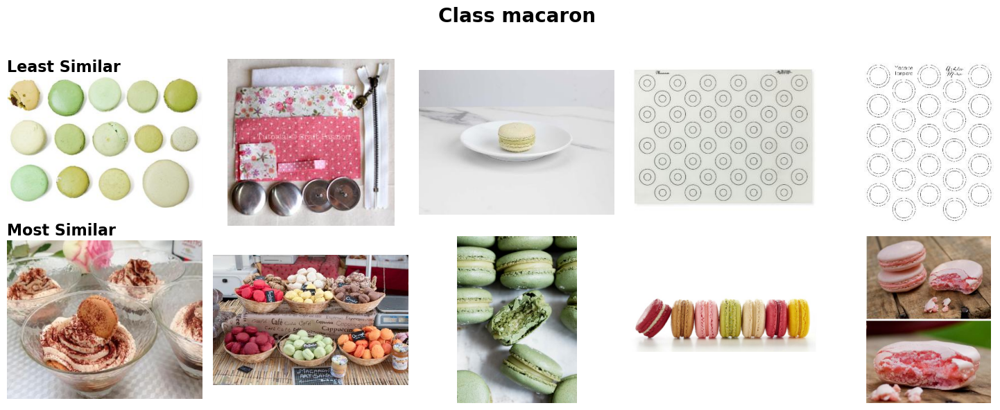

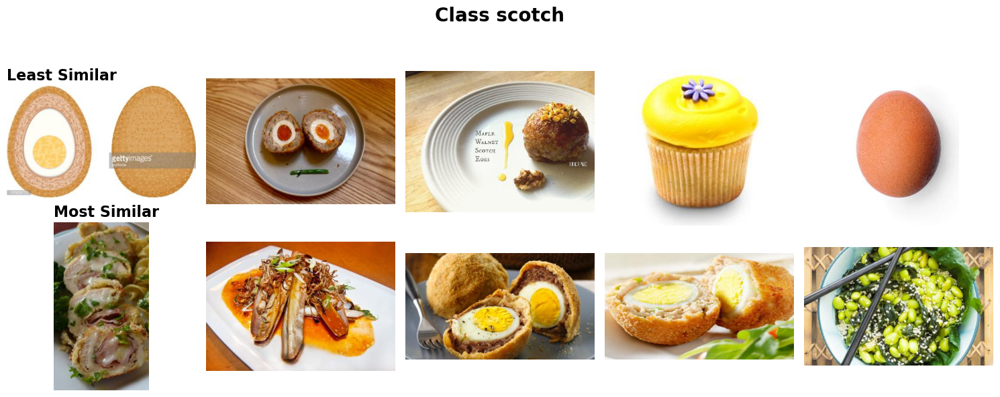

In [32]:
#@title BoVW
for c, c_name in zip(classes[2:4], classes_names[2:4]):
  show_lf_five(c, c_name, get_bovw_vectors(c, 80))

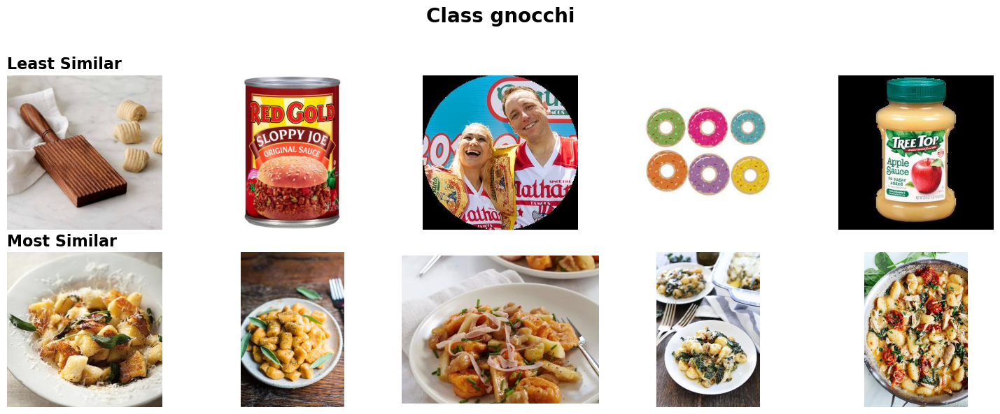

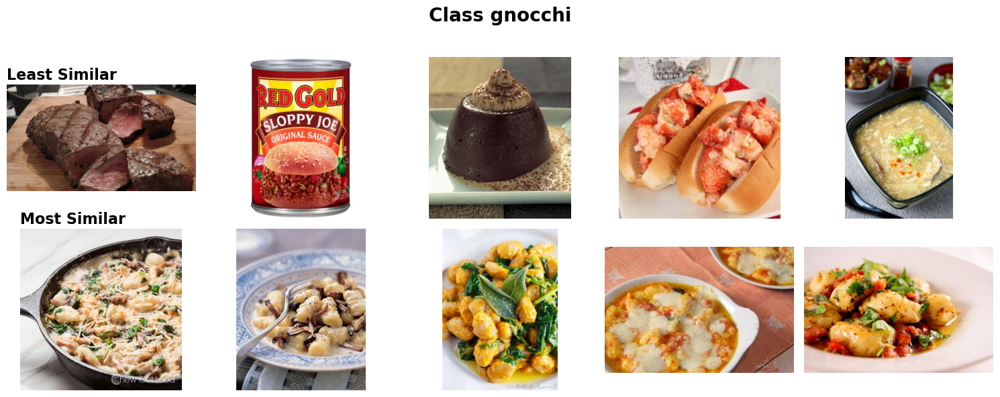

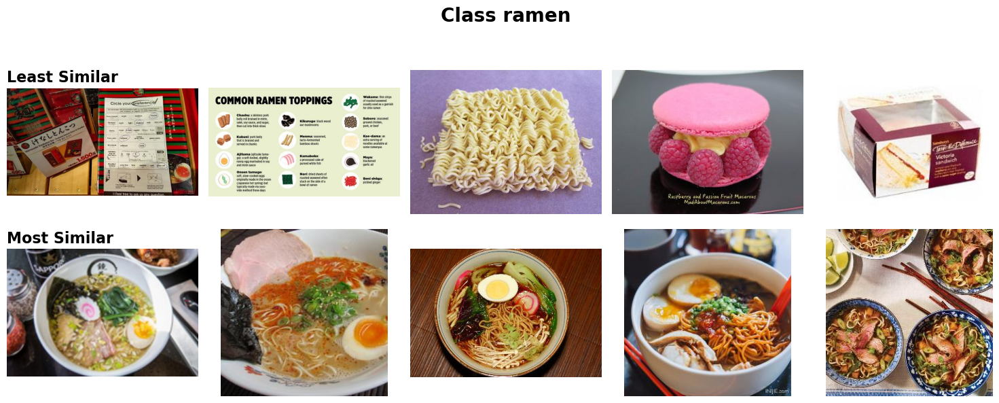

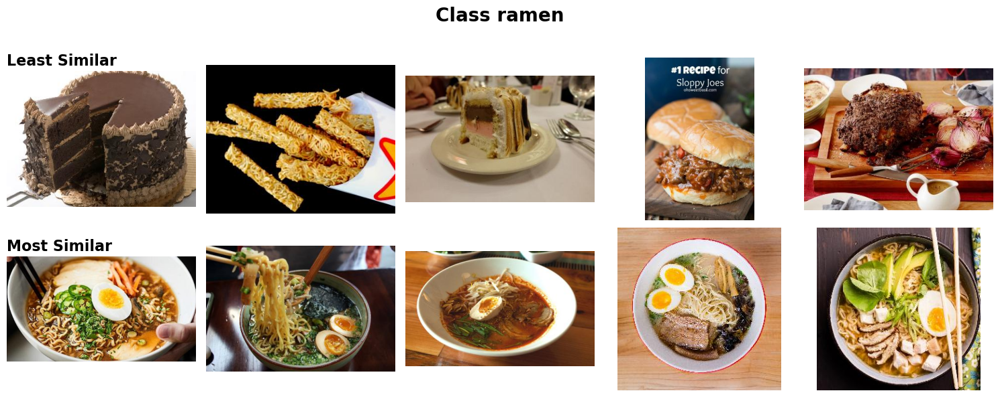

In [33]:
#@title Feature extraction with ViT
for c, c_name in zip(classes[4:6], classes_names[4:6]):
  show_lf_five(c, c_name, get_fe_vectors(c, "imagenet"))
  show_lf_five(c, c_name, get_fe_vectors(c, "food"))

## Thresholding with outliers

In [34]:
#@title Color histograms
for bins in [8, 256]:
  print(f"COLOR HIST {bins}")
  for c, c_name in zip(classes, classes_names):
      vectors = get_ch_vectors(c, bins=bins)

      similarities = get_similarities(vectors)

      to_remove_outliers = get_outliers(similarities)

      print(
          f"For class {c_name} \t"
          f"OUTLIERS {np.round((len(to_remove_outliers[to_remove_outliers['predicted'] == 1]) / len(to_remove_outliers)) * 100, 2)}"
      )

COLOR HIST 8
For class omelette 	OUTLIERS 3.86
For class seaweed 	OUTLIERS 2.75
For class macaron 	OUTLIERS 3.46
For class scotch 	OUTLIERS 3.87
For class gnocchi 	OUTLIERS 3.4
For class ramen 	OUTLIERS 3.51
COLOR HIST 256
For class omelette 	OUTLIERS 3.86
For class seaweed 	OUTLIERS 4.67
For class macaron 	OUTLIERS 0.0
For class scotch 	OUTLIERS 5.81
For class gnocchi 	OUTLIERS 4.92
For class ramen 	OUTLIERS 7.03


In [35]:
#@title BoVW
for dims in [40, 80]:
  print(f"BOVW {dims}")
  for c, c_name in zip(classes, classes_names):
      vectors = get_bovw_vectors(c, dims)

      similarities = get_similarities(vectors)

      to_remove_outliers = get_outliers(similarities)

      print(
          f"For class {c_name} \t"
          f"OUTLIERS {np.round((len(to_remove_outliers[to_remove_outliers['predicted'] == 1]) / len(to_remove_outliers)) * 100, 2)}"
      )

BOVW 40
For class omelette 	OUTLIERS 5.6
For class seaweed 	OUTLIERS 2.47
For class macaron 	OUTLIERS 2.19
For class scotch 	OUTLIERS 5.08
For class gnocchi 	OUTLIERS 4.42
For class ramen 	OUTLIERS 4.92
BOVW 80
For class omelette 	OUTLIERS 5.98
For class seaweed 	OUTLIERS 3.3
For class macaron 	OUTLIERS 3.1
For class scotch 	OUTLIERS 5.08
For class gnocchi 	OUTLIERS 5.1
For class ramen 	OUTLIERS 4.92


In [36]:
#@title Feature extraction with ViT
for dataset in ["imagenet", "food"]:
  print(f"VIT FE {dataset}")
  for c, c_name in zip(classes, classes_names):
      vectors = get_fe_vectors(c, "food")

      similarities = get_similarities(vectors)

      to_remove_outliers = get_outliers(similarities)

      print(
          f"For class {c_name} \t"
          f"OUTLIERS {np.round((len(to_remove_outliers[to_remove_outliers['predicted'] == 1]) / len(to_remove_outliers)) * 100, 2)}"
      )

VIT FE imagenet
For class omelette 	OUTLIERS 0.0
For class seaweed 	OUTLIERS 0.0
For class macaron 	OUTLIERS 16.03
For class scotch 	OUTLIERS 0.0
For class gnocchi 	OUTLIERS 0.0
For class ramen 	OUTLIERS 0.0
VIT FE food
For class omelette 	OUTLIERS 0.0
For class seaweed 	OUTLIERS 0.0
For class macaron 	OUTLIERS 16.03
For class scotch 	OUTLIERS 0.0
For class gnocchi 	OUTLIERS 0.0
For class ramen 	OUTLIERS 0.0


## Thresholding with Q1

In [41]:
#@title Color histograms
for bins in [8, 256]:
  print(f"COLOR HIST {bins}")
  for c, c_name in zip(classes, classes_names):
      vectors = get_ch_vectors(c, bins=bins)

      similarities = get_similarities(vectors)

      to_remove_quartile = get_percentile(similarities, 25)

      # Check correctness
      precision, fpr = check_accuracy(c, to_remove_quartile)

      print(f"Precision {np.round(precision * 100, 2)}%"
            f"\t FPR {np.round(fpr * 100, 2)}%"
            f"\t --> class {c_name} ")

COLOR HIST 8
Precision 26.85%	 FPR 24.63%	 --> class omelette 
Precision 25.0%	 FPR 25.0%	 --> class seaweed 
Precision 25.88%	 FPR 25.0%	 --> class macaron 
Precision 30.17%	 FPR 23.23%	 --> class scotch 
Precision 37.21%	 FPR 21.74%	 --> class gnocchi 
Precision 35.76%	 FPR 19.2%	 --> class ramen 
COLOR HIST 256
Precision 28.7%	 FPR 24.15%	 --> class omelette 
Precision 21.77%	 FPR 26.67%	 --> class seaweed 
Precision 28.24%	 FPR 24.57%	 --> class macaron 
Precision 31.03%	 FPR 22.9%	 --> class scotch 
Precision 34.88%	 FPR 22.39%	 --> class gnocchi 
Precision 37.09%	 FPR 18.48%	 --> class ramen 


In [42]:
#@title BoVW
for dims in [40, 80]:
  print(f"BOVW {dims}")
  for c, c_name in zip(classes, classes_names):
      vectors = get_bovw_vectors(c, dims)

      similarities = get_similarities(vectors)

      to_remove_quartile = get_percentile(similarities, 25)

      # Check correctness
      precision, fpr = check_accuracy(c, to_remove_quartile)

      print(f"Precision {np.round(precision * 100, 2)}%"
            f"\t FPR {np.round(fpr * 100, 2)}%"
            f"\t --> class {c_name} ")

BOVW 40
Precision 36.11%	 FPR 22.2%	 --> class omelette 
Precision 35.48%	 FPR 19.58%	 --> class seaweed 
Precision 33.33%	 FPR 23.49%	 --> class macaron 
Precision 25.86%	 FPR 24.92%	 --> class scotch 
Precision 27.34%	 FPR 24.35%	 --> class gnocchi 
Precision 35.1%	 FPR 19.57%	 --> class ramen 
BOVW 80
Precision 33.33%	 FPR 22.93%	 --> class omelette 
Precision 39.52%	 FPR 17.5%	 --> class seaweed 
Precision 33.33%	 FPR 23.49%	 --> class macaron 
Precision 24.14%	 FPR 25.59%	 --> class scotch 
Precision 28.91%	 FPR 23.91%	 --> class gnocchi 
Precision 36.42%	 FPR 18.84%	 --> class ramen 


In [43]:
#@title Feature extraction with ViT
for dataset in ["imagenet", "food"]:
  print(f"VIT FE {dataset}")
  for c, c_name in zip(classes, classes_names):
      vectors = get_fe_vectors(c, dataset)

      similarities = get_similarities(vectors)

      to_remove_quartile = get_percentile(similarities, 25)

      # Check correctness
      precision, fpr = check_accuracy(c, to_remove_quartile)

      print(f"Precision {np.round(precision * 100, 2)}%"
            f"\t FPR {np.round(fpr * 100, 2)}%"
            f"\t --> class {c_name} ")

VIT FE imagenet
Precision 86.11%	 FPR 9.02%	 --> class omelette 
Precision 59.68%	 FPR 7.08%	 --> class seaweed 
Precision 81.18%	 FPR 14.87%	 --> class macaron 
Precision 78.45%	 FPR 4.38%	 --> class scotch 
Precision 59.69%	 FPR 15.43%	 --> class gnocchi 
Precision 64.24%	 FPR 3.62%	 --> class ramen 
VIT FE food
Precision 84.26%	 FPR 9.51%	 --> class omelette 
Precision 72.58%	 FPR 0.42%	 --> class seaweed 
Precision 82.35%	 FPR 14.66%	 --> class macaron 
Precision 79.31%	 FPR 4.04%	 --> class scotch 
Precision 83.72%	 FPR 8.7%	 --> class gnocchi 
Precision 69.54%	 FPR 0.72%	 --> class ramen 


## Evaluate ViT with other thresholds

In [51]:
for perc in [25, 30, 35, 40, 45, 50]:
    print(f"Using threshold p{perc} ----------------------------------")
    for dataset in ["imagenet", "food"]:
      print(f"VIT FE {dataset}")
      sum_precision, sum_fpr = [], []
      for c, c_name in zip(classes, classes_names):
          vectors = get_fe_vectors(c, dataset)
    
          similarities = get_similarities(vectors)
    
          to_remove_quartile = get_percentile(similarities, perc)
    
          # Check correctness
          precision, fpr = check_accuracy(c, to_remove_quartile)
          
          sum_precision.append(precision)
          sum_fpr.append(fpr)
    
      print(
          f"Mean Precision {np.round((np.sum(sum_precision)/6) * 100, 2)}%"
          f"\t Mean FPR {np.round((np.sum(sum_fpr)/6) * 100, 2)}%"
      )

Using threshold p25 ----------------------------------
VIT FE imagenet
Mean Precision 71.56%	 Mean FPR 9.07%
VIT FE food
Mean Precision 78.63%	 Mean FPR 6.34%
Using threshold p30 ----------------------------------
VIT FE imagenet
Mean Precision 80.63%	 Mean FPR 12.31%
VIT FE food
Mean Precision 86.57%	 Mean FPR 9.84%
Using threshold p35 ----------------------------------
VIT FE imagenet
Mean Precision 87.17%	 Mean FPR 16.51%
VIT FE food
Mean Precision 91.9%	 Mean FPR 14.43%
Using threshold p40 ----------------------------------
VIT FE imagenet
Mean Precision 92.01%	 Mean FPR 21.37%
VIT FE food
Mean Precision 96.11%	 Mean FPR 19.53%
Using threshold p45 ----------------------------------
VIT FE imagenet
Mean Precision 94.5%	 Mean FPR 27.01%
VIT FE food
Mean Precision 97.25%	 Mean FPR 25.9%
Using threshold p50 ----------------------------------
VIT FE imagenet
Mean Precision 96.44%	 Mean FPR 33.17%
VIT FE food
Mean Precision 97.96%	 Mean FPR 32.51%
